## ◇株価予測（回帰）◇ 

#### 目次  
・1：準備～データの可視化  
・2：ランダムフォレスト  
・3：LightGBM  
・4：LSTM  
・5：prophet  
・6：多変量LSTM  
・得た知見、考察 
・メモ

#### モチベーション
・時系列分析の学習  
・以前購入して塩漬けになっている株の行く末を予測したい 

## 

## 1. 準備、データの読み込み、可視化

・AKIBAホールディングスの時系列データより、株価チャートを表示させてみる

In [3]:
import pandas as pd
import seaborn as sns
import numpy as np
import japanize_matplotlib
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import mplfinance as mpf
import yfinance as yf
import talib as ta
import lightgbm as lgb
import plotly.graph_objects as go
from pandas_datareader import data
from datetime import datetime, timedelta
from plotly.subplots import make_subplots
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import mean_absolute_error
from keras.models import Sequential
from keras.layers import Dense, LSTM
from keras.layers import Dropout
from prophet import Prophet

In [4]:
#ワーニングを非表示にする設定
import warnings
warnings.simplefilter('ignore')

In [5]:
#最大表示行数の指定
pd.set_option('display.max_rows', 10)

In [75]:
#データの取得
from pandas_datareader import data

start = "2011-09-01"
dt = datetime.today() 
end = dt.date()

df = data.DataReader("6840.T", "yahoo", start, end)
date= df.index

In [76]:
df

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2011-09-01,71.0,68.0,69.0,69.0,44000.0,69.0
2011-09-02,69.0,69.0,69.0,69.0,6000.0,69.0
2011-09-05,69.0,68.0,69.0,68.0,15000.0,68.0
2011-09-06,69.0,68.0,69.0,69.0,39000.0,69.0
2011-09-07,70.0,69.0,69.0,70.0,11000.0,70.0
...,...,...,...,...,...,...
2022-10-05,349.0,336.0,346.0,340.0,37100.0,340.0
2022-10-06,351.0,337.0,337.0,350.0,34000.0,350.0
2022-10-07,357.0,347.0,350.0,356.0,51500.0,356.0


In [13]:
#単純移動平均を追加
df["5日間移動平均"]=df["Adj Close"].rolling(5).mean().round(1)
df["25日間移動平均"]=df["Adj Close"].rolling(25).mean().round(1)
df["50日間移動平均"]=df["Adj Close"].rolling(50).mean().round(1)

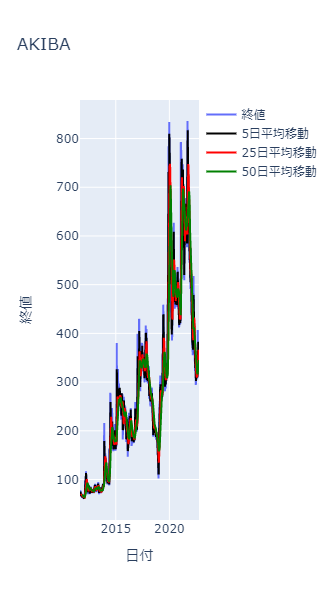

In [14]:
#Figureオブジェクト作成
fig = go.Figure()

#traceをFigureに追加
fig.add_trace(go.Scatter(x=date, y=df['Adj Close'], name="終値"))
fig.add_trace(go.Scatter(x=date, y=df["5日間移動平均"], name="5日平均移動", line=dict(color="black")))
fig.add_trace(go.Scatter(x=date, y=df["25日間移動平均"], name="25日平均移動", line=dict(color="red")))
fig.add_trace(go.Scatter(x=date, y=df["50日間移動平均"], name="50日平均移動", line=dict(color="green")))

#レイアウトの設定
fig.update_layout(title='AKIBA', width=1000, height=600)
 
#軸の設定
fig.update_xaxes(title='日付')
fig.update_yaxes(title='終値')

fig.show()

## 2. ランダムフォレスト

・ランダムフォレストを用いて、25日後の株価を直近25日間だけ予測し、実際の株価と比較してみることとする

参考：https://x.gd/tcPVj

＜得られた結果＞  
・実際の株価と大きく乖離する値となった

In [77]:
#データの取得
from pandas_datareader import data

start = "2011-09-01"
dt = datetime.today() 
end = dt.date()

df = data.DataReader("6840.T", "yahoo", start, end)
date= df.index

In [78]:
#単純移動平均
df["5日間移動平均"]=df["Adj Close"].rolling(5).mean().round(1)
df["25日間移動平均"]=df["Adj Close"].rolling(25).mean().round(1)
df["50日間移動平均"]=df["Adj Close"].rolling(50).mean().round(1)

#MACD
df['macd'], df['macdsignal'], df['macdhist'] = ta.MACD(df['Adj Close'], fastperiod=12, slowperiod=26, signalperiod=9)

#RSI（25日）
df['RSI'] = ta.RSI(df['Adj Close'], timeperiod=25)

#ボリンジャーバンド
df['upper'], df['middle'], df['lower'] = ta.BBANDS(df['Adj Close'], timeperiod=25, nbdevup=2, nbdevdn=2, matype=0)

In [79]:
#25日後の株価を予測, かつ25日間を予測したい
future_days = 25
predict_period = 25

#将来の「ｘ」日を予測する変数を作成
df['Prediction'] = df['Adj Close'].shift(-future_days)

#直近5日等のデータを見る
df.head()

,High,Low,Open,Close,Volume,Adj Close,5日間移動平均,25日間移動平均,50日間移動平均,macd,macdsignal,macdhist,RSI,upper,middle,lower,Prediction
Date,,,,,,,,,,,,,,,,,
2011-09-01,71.0,68.0,69.0,69.0,44000.0,69.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,69.0
2011-09-02,69.0,69.0,69.0,69.0,6000.0,69.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,68.0
2011-09-05,69.0,68.0,69.0,68.0,15000.0,68.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,68.0
2011-09-06,69.0,68.0,69.0,69.0,39000.0,69.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.0
2011-09-07,70.0,69.0,69.0,70.0,11000.0,70.0,69.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,67.0


In [80]:
#説明変数
X = np.array(df.drop(['Prediction', 'Close'],1))[50:-(future_days+predict_period)]
print(X)

[[ 65.          64.          64.         ...  70.02663566  67.16
   64.29336434]
 [ 63.          62.          62.         ...  70.23316361  66.96
   63.68683639]
 [ 63.          63.          63.         ...  70.35020891  66.76
   63.16979109]
 ...
 [321.         317.         321.         ... 328.28519916 312.28
  296.27480084]
 [321.         316.         318.         ... 328.5585929  312.64
  296.7214071 ]
 [322.         310.         322.         ... 328.31612682 313.24
  298.16387318]]


In [81]:
#説明変数
y = np.array(df['Prediction'])[50:-(future_days+predict_period)]
print(y)

[ 63.  63.  62. ... 372. 355. 356.]


In [82]:
#訓練と検証用に分割（検証を行っていないので、あまり意味がない）
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

In [83]:
#学習モデルを作成
rfc = RandomForestRegressor(max_depth = 30)

#学習モデルにテストデータを与えて学習させる
rfc.fit(x_train, y_train)

RandomForestRegressor(max_depth=30)

In [84]:
#将来を予測するデータを取得

#最後の'x'日を除く元のデータセットからのすべての行
x_future = df.drop(['Prediction', 'Close'],1)[50:-future_days]

#最後の'x'行を取得 = 直近25日間のデータに将来の25日を予測させようとしている
x_future = x_future.tail(future_days)
x_future

,High,Low,Open,Volume,Adj Close,5日間移動平均,25日間移動平均,50日間移動平均,macd,macdsignal,macdhist,RSI,upper,middle,lower
Date,,,,,,,,,,,,,,,
2022-07-29,317.0,311.0,317.0,14700.0,315.0,316.8,313.7,320.8,-0.828190,-1.888330,1.060140,45.451215,328.286519,313.68,299.073481
2022-08-01,316.0,309.0,313.0,21900.0,316.0,315.8,313.8,320.5,-0.838250,-1.678314,0.840064,45.830416,328.431473,313.80,299.168527
2022-08-02,319.0,309.0,319.0,14200.0,309.0,314.2,313.6,319.8,-1.394983,-1.621647,0.226664,43.619402,328.301289,313.56,298.818711
2022-08-03,313.0,307.0,311.0,15100.0,309.0,312.8,313.4,319.3,-1.815273,-1.660373,-0.154901,43.619402,328.207276,313.36,298.512724
2022-08-04,313.0,305.0,310.0,19100.0,310.0,311.8,313.1,318.9,-2.044101,-1.737118,-0.306983,44.037898,327.982786,313.12,298.257214
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-08-29,392.0,378.0,383.0,177000.0,383.0,377.2,331.3,321.0,16.547083,9.508487,7.038596,60.371478,383.695326,331.28,278.864674
2022-08-30,399.0,379.0,399.0,128400.0,379.0,377.0,333.6,322.5,17.106493,11.028088,6.078405,59.341995,389.037172,333.60,278.162828
2022-08-31,385.0,372.0,385.0,75500.0,372.0,380.0,335.8,324.0,16.791427,12.180756,4.610671,57.552947,392.771572,335.80,278.828428


In [85]:
#データセットをnumpy配列に変換
x_future = np.array(x_future)

In [86]:
prediction = rfc.predict(x_future)
prediction

array([318.135     , 320.65      , 330.155     , 323.64399994,
       317.10899994, 320.3       , 314.04      , 319.935     ,
       317.415     , 335.65      , 343.03      , 422.87      ,
       537.03      , 573.605     , 653.81      , 636.39      ,
       577.235     , 561.125     , 534.955     , 461.62      ,
       436.58      , 399.13      , 336.005     , 334.335     ,
       335.28      ])

In [87]:
#モデルによる予測モデルを作成
predictions = prediction

#データをプロット
valid = df[X.shape[0]+50+future_days:]

#予測価格を保持する新しい列を作成
valid['Predictions'] = predictions
valid

,High,Low,Open,Close,Volume,Adj Close,5日間移動平均,25日間移動平均,50日間移動平均,macd,macdsignal,macdhist,RSI,upper,middle,lower,Prediction,Predictions
Date,,,,,,,,,,,,,,,,,,
2022-09-05,372.0,350.0,353.0,368.0,70000.0,368.0,366.0,341.1,327.4,13.130748,12.942350,0.188398,56.050800,397.878633,341.12,284.361367,NaN,318.135
2022-09-06,381.0,365.0,365.0,369.0,51900.0,369.0,364.0,343.2,328.5,12.771462,12.908172,-0.136710,56.245533,400.046422,343.24,286.433578,NaN,320.650
2022-09-07,370.0,353.0,369.0,359.0,38800.0,359.0,361.4,345.2,329.4,11.546706,12.635879,-1.089173,53.764060,400.585547,345.24,289.894453,NaN,330.155
2022-09-08,368.0,359.0,363.0,368.0,23800.0,368.0,364.0,347.6,330.5,11.173501,12.343403,-1.169902,55.600476,401.577773,347.60,293.622227,NaN,323.644
2022-09-09,381.0,362.0,368.0,374.0,49700.0,374.0,367.6,350.2,331.6,11.232404,12.121203,-0.888800,56.792241,402.816411,350.16,297.503589,NaN,317.109
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-05,349.0,336.0,346.0,340.0,37100.0,340.0,339.0,358.1,344.7,-4.621168,-1.336537,-3.284631,48.099586,393.552505,358.12,322.687495,NaN,436.580
2022-10-06,351.0,337.0,337.0,350.0,34000.0,350.0,340.0,357.0,345.3,-3.864917,-1.842213,-2.022704,50.626048,391.469036,356.96,322.450964,NaN,399.130
2022-10-07,357.0,347.0,350.0,356.0,51500.0,356.0,344.4,356.3,346.1,-2.749736,-2.023717,-0.726018,52.083867,390.278657,356.32,322.361343,NaN,336.005


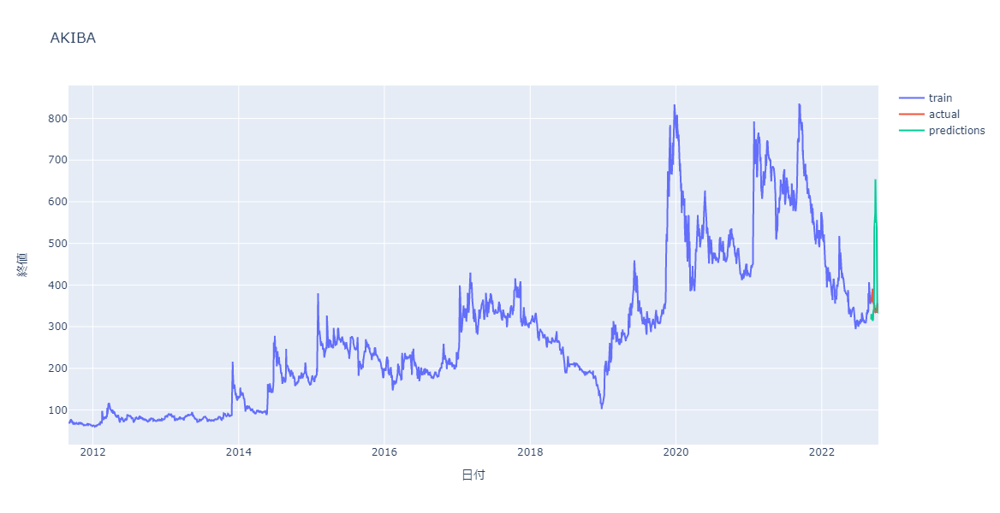

In [88]:
#可視化
pre_date = valid.index

fig = go.Figure()

fig.add_trace(go.Scatter(x=date, y=df['Adj Close'], name='train'))
fig.add_trace(go.Scatter(x=pre_date, y=valid['Adj Close'], name='actual'))
fig.add_trace(go.Scatter(x=pre_date, y=valid['Predictions'], name='predictions'))

fig.update_layout(title='AKIBA', width=1000, height=600)
fig.update_xaxes(title='日付')
fig.update_yaxes(title='終値')

fig.show()

In [89]:
valid_scores = []
actual = np.array(valid['Adj Close'])

#予測精度(RMSE)の算出
score = np.sqrt(mse(actual, prediction))

#予測精度スコアをリストに格納
valid_scores.append(score)

print(f'valid_scores: {valid_scores}')
#およそ（下記スコア）円の誤差で予測できている?

valid_scores: [140.19085277996697]


## 2-1. ランダムフォレスト（検証）

①あまり上手くいっていないように見えるが、予測する期間の長さや予測する未来の近さを変えたらどうなるか？  

＜得られた結果＞  
・25日後の予測では、長い期間を予測させてもうまくいっていないことは明らか  
・3日後の予測でも大きく外しているところがあり、1日後という直近の株価でやっと正しそうな予測になった

②銘柄を変えても同様か  

＜得られた結果＞  
・概ね同様

In [28]:
#前処理まｄ終わっている状態で、予測する範囲を指定するだけで可視化まで行える関数を用意しておく
def AKIBA_stock(future_days, predict_period):

    #将来の「ｘ」日を予測する変数を作成
    df['Prediction'] = df['Adj Close'].shift(-future_days)

    #説明変数
    X = np.array(df.drop(['Prediction', 'Close'],1))[50:-(future_days+predict_period)]

    #説明変数
    y = np.array(df['Prediction'])[50:-(future_days+predict_period)]

    #訓練と検証用に分割（検証を行っていないので、あまり意味がない）
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

    #学習モデルを作成
    model = RandomForestRegressor(max_depth = 30)

    #学習モデルにテストデータを与えて学習させる
    model.fit(x_train, y_train)

    #最後の'x'日を除く元のデータセットからのすべての行
    x_future = df.drop(['Prediction', 'Close'],1)[50:-future_days]

    #最後の'x'行を取得
    x_future = x_future.tail(predict_period)

    #データセットをnumpy配列に変換
    x_future = np.array(x_future)

    prediction = model.predict(x_future)

    #モデルによる予測モデルを作成
    predictions = prediction

    #データをプロット
    valid = df[X.shape[0]+50+future_days:]

    #予測価格を保持する新しい列を作成
    valid['Predictions'] = predictions

    #可視化
    pre_date = valid.index

    fig = go.Figure()

    fig.add_trace(go.Scatter(x=date, y=df['Adj Close'], name='train'))
    fig.add_trace(go.Scatter(x=pre_date, y=valid['Adj Close'], name='actual'))
    fig.add_trace(go.Scatter(x=pre_date, y=valid['Predictions'], name='predictions'))

    fig.update_layout(title='AKIBA', width=1000, height=600)
    fig.update_xaxes(title='日付')
    fig.update_yaxes(title='終値')

    fig.show()

▼ もう少し長い期間を予測させてみたらどうか？

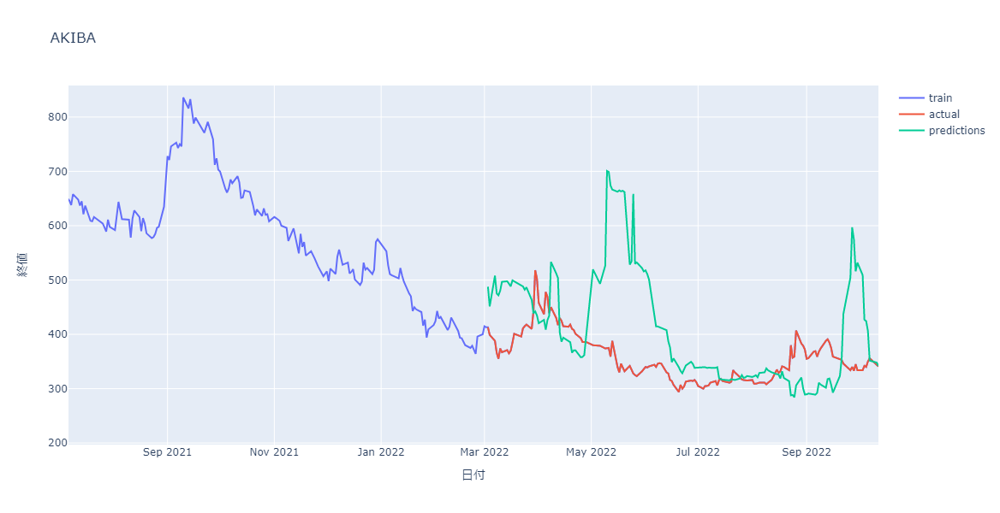

In [29]:
#25日後の株価を150日間予測する
AKIBA_stock(25, 150)

▼ もう少し近い近い未来を予測させたらどうか？

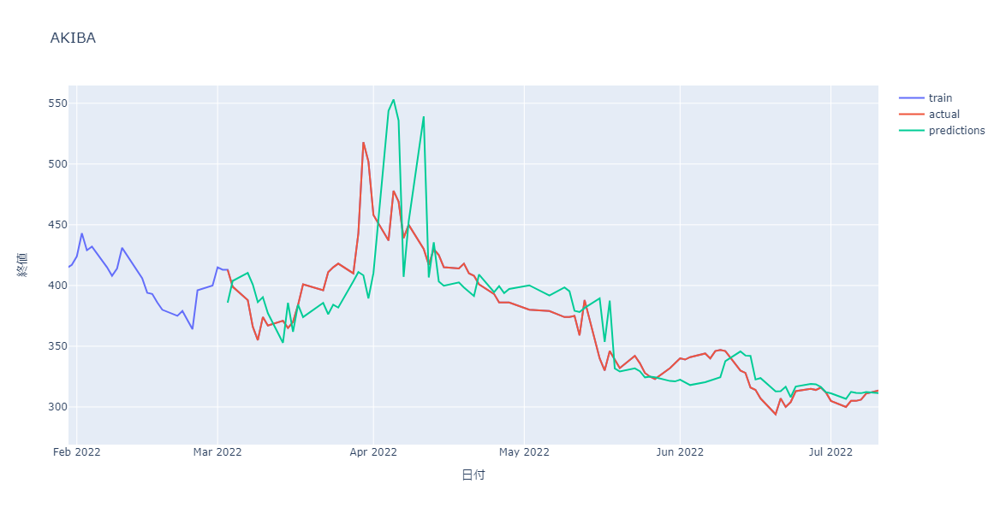

In [30]:
#3日後の株価を150日間予測する
AKIBA_stock(3, 150)

▼ 明日を予測させてみたらどうか？

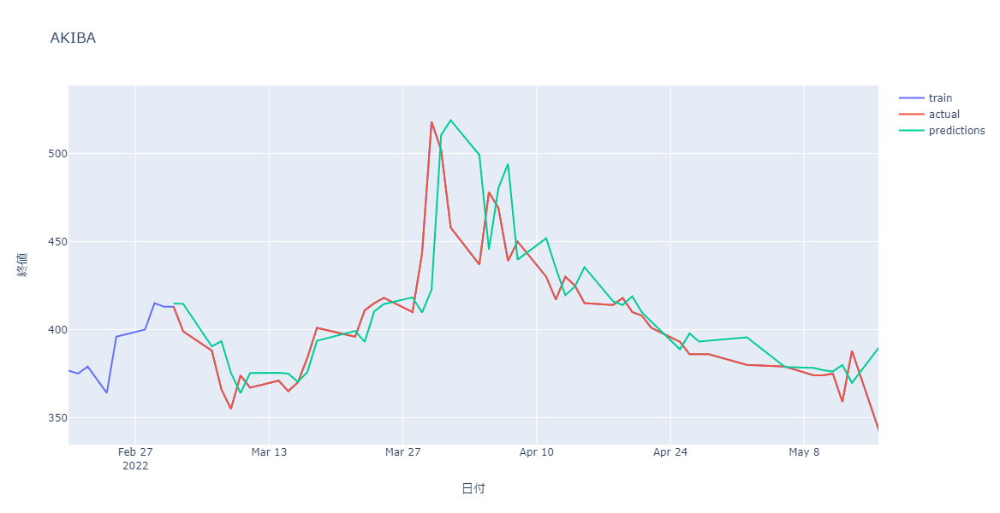

In [31]:
#1日後の株価を150日間予測する
AKIBA_stock(1, 150)

▼ 違う銘柄だったらどうなるか？

・日経平均株価で検証

In [32]:
#株価の取得から可視化までを関数にしておく
from pandas_datareader import data

def company_stock(company_code, future_days, predict_period):
    '''
    company_code = 株価コード
    future_days = x日後の株価を予想
    predict_period = x日間の株価を予想
    '''
    
    start = "2011-09-01"
    dt = datetime.today() 
    end = dt.date()

    df = data.DataReader(company_code, "yahoo", start, end)
    date= df.index

    #単純移動平均
    df["5日間移動平均"]=df["Adj Close"].rolling(5).mean().round(1)
    df["25日間移動平均"]=df["Adj Close"].rolling(25).mean().round(1)
    df["50日間移動平均"]=df["Adj Close"].rolling(50).mean().round(1)

    #MACD
    df['macd'], df['macdsignal'], df['macdhist'] = ta.MACD(df['Adj Close'], fastperiod=12, slowperiod=26, signalperiod=9)

    #RSI（25日）
    df['RSI'] = ta.RSI(df['Adj Close'], timeperiod=25)

    #ボリンジャーバンド
    df['upper'], df['middle'], df['lower'] = ta.BBANDS(df['Adj Close'], timeperiod=25, nbdevup=2, nbdevdn=2, matype=0)

    #将来の「ｘ」日を予測する変数を作成
    df['Prediction'] = df['Adj Close'].shift(-future_days)

    #説明変数
    X = np.array(df.drop(['Prediction', 'Close'],1))[50:-(future_days+predict_period)]

    #説明変数
    y = np.array(df['Prediction'])[50:-(future_days+predict_period)]

    #訓練と検証用に分割（検証を行っていないので、あまり意味がない）
    x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

    #学習モデルを作成
    model = RandomForestRegressor(max_depth = 30)

    #学習モデルにテストデータを与えて学習させる
    model.fit(x_train, y_train)

    #最後の'x'日を除く元のデータセットからのすべての行
    x_future = df.drop(['Prediction', 'Close'],1)[50:-future_days]

    #最後の'x'行を取得
    x_future = x_future.tail(predict_period)

    #データセットをnumpy配列に変換
    x_future = np.array(x_future)

    prediction = model.predict(x_future)

    #モデルによる予測モデルを作成
    predictions = prediction

    #データをプロット
    valid = df[X.shape[0]+50+future_days:]

    #予測価格を保持する新しい列を作成
    valid['Predictions'] = predictions

    #可視化
    pre_date = valid.index

    fig = go.Figure()

    fig.add_trace(go.Scatter(x=date, y=df['Adj Close'], name='train'))
    fig.add_trace(go.Scatter(x=pre_date, y=valid['Adj Close'], name='actual'))
    fig.add_trace(go.Scatter(x=pre_date, y=valid['Predictions'], name='predictions'))

    fig.update_layout(title=company_code, width=1000, height=600)
    fig.update_xaxes(title='日付')
    fig.update_yaxes(title='終値')

    fig.show()

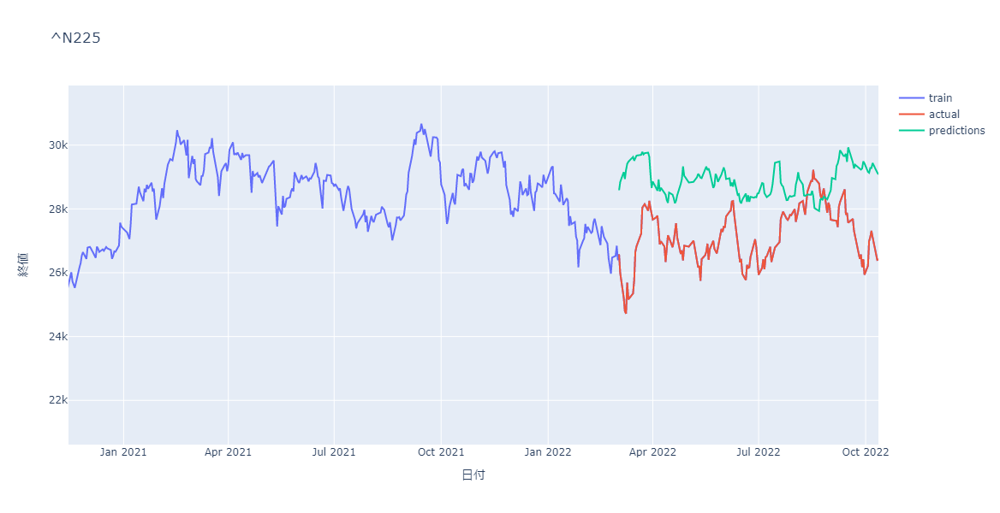

In [34]:
#25日後の日経平均株価を150日分予測する
company_stock("^N225", 25, 150)

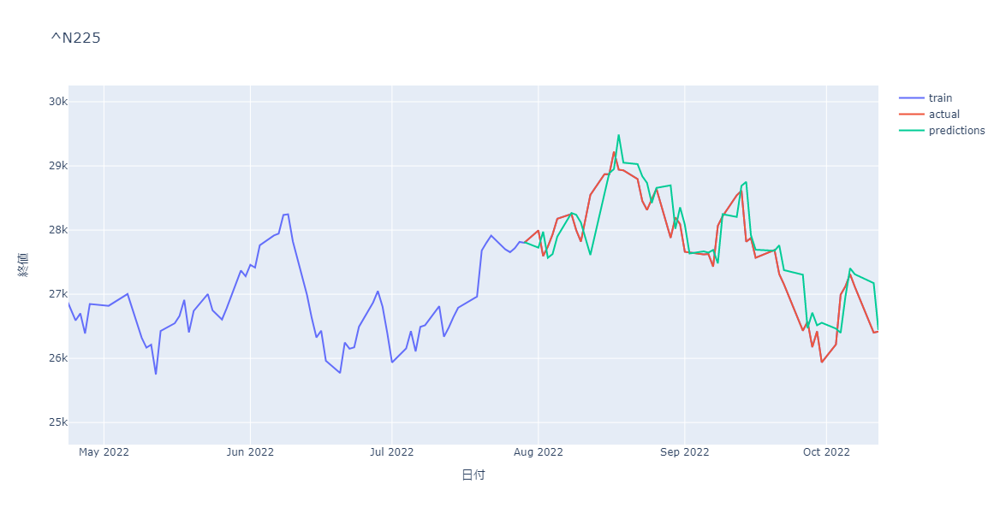

In [35]:
#1日後の日経平均株価を50日分予測する
company_stock("^N225", 1, 50)

## 3. LGBM

・ランダムフォレストに続き、精度がよくなる＝予測線が実線の数日遅れで表れているよう  
・これらはラグモデルと呼ばれ、前日の株価を翌日の株価として扱うという状況になっているらしい（特徴量重要度のうち、最も高いものは終値であることも確認できた）

参考：https://book-read-yoshi.hatenablog.com/entry/2021/04/19/AI-machine-learning-stock-prediction-lightgbm

In [23]:
#データの取得
from pandas_datareader import data

start = "2011-09-01"
dt = datetime.today() 
end = dt.date()

df = data.DataReader("6840.T", "yahoo", start, end)
date = df.index

#MACD
df['macd'], df['macdsignal'], df['macdhist'] = ta.MACD(df['Adj Close'], fastperiod=12, slowperiod=26, signalperiod=9)

#RSI（25日）
df['RSI'] = ta.RSI(df['Adj Close'], timeperiod=25)

#ボリンジャーバンド
df['upper'], df['middle'], df['lower'] = ta.BBANDS(df['Adj Close'], timeperiod=25, nbdevup=2, nbdevdn=2, matype=0)

##  ________________________________________________________________________________________

#x日後の株価を予測, かつx日間を予測したい
future_days = 1
predict_period = 150

###  ________________________________________________________________________________________

#将来の「ｘ」日を予測する変数を作成
df['Prediction'] = df['Adj Close'].shift(-future_days)

#説明変数
X = df.drop(['Prediction', 'Close'], 1)[50:-(future_days+predict_period)]

#説明変数
y = df['Prediction'][50:-(future_days+predict_period)]

#訓練と検証用に分割
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)
 
trains = lgb.Dataset(x_train, y_train)
valids = lgb.Dataset(x_test, y_test)

#モデル構築
params = {'boosting_type': 'gbdt',
 'objective': 'regression_l1',
 'metric': 'l1',
 'learning_rate': 0.01,
 'verbosity': -1,
 'random_state': 42,
 'feature_pre_filter': False,
 'bagging_freq': 6,
 'lambda_l1': 0.1,
 'lambda_l2': 10,
 'num_leaves': 3000,
 'feature_fraction': 0.4,
 'bagging_fraction': 0.95,
 'min_child_samples': 20,
 'num_iterations': 10000,
 'early_stopping_round': 100}

model = lgb.train(params, trains, valid_sets = [trains, valids], verbose_eval =1000)

Training until validation scores don't improve for 100 rounds
[1000]	training's l1: 5.33248	valid_1's l1: 8.38992
Early stopping, best iteration is:
[1058]	training's l1: 5.2718	valid_1's l1: 8.38495


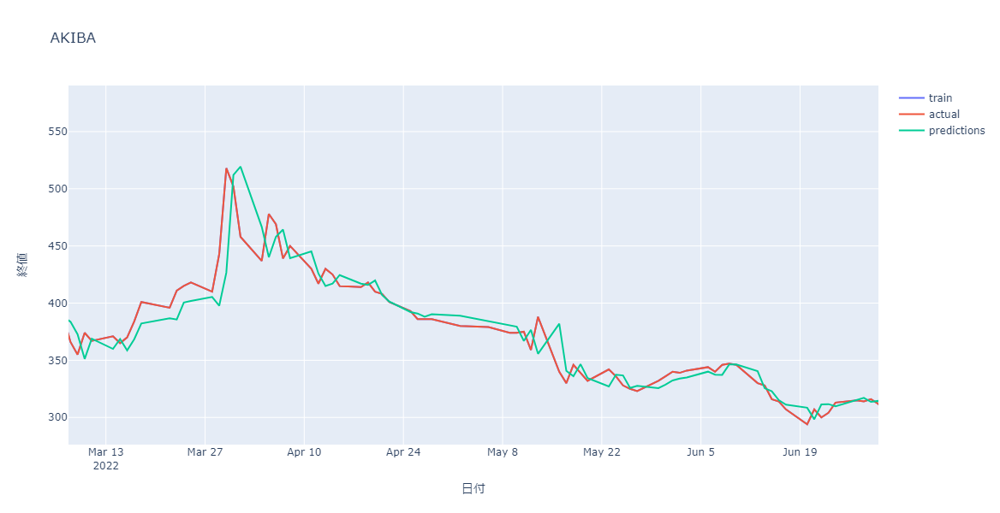

In [24]:
#最後の'x'日を除く元のデータセットからのすべての行
x_future = df.drop(['Prediction', 'Close'],1)[50:-future_days]

#最後の'x'行を取得
x_future = x_future.tail(predict_period)

#データセットをnumpy配列に変換
x_future = np.array(x_future)

prediction = model.predict(x_future)

#モデルによる予測モデルを作成
predictions = prediction

#データをプロット
valid = df[X.shape[0]+50+future_days:]

#予測価格を保持する新しい列を作成
valid['Predictions'] = predictions

#可視化
pre_date = valid.index

fig = go.Figure()

fig.add_trace(go.Scatter(x=date, y=df['Adj Close'], name='train'))
fig.add_trace(go.Scatter(x=pre_date, y=valid['Adj Close'], name='actual'))
fig.add_trace(go.Scatter(x=pre_date, y=valid['Predictions'], name='predictions'))

fig.update_layout(title='AKIBA', width=1000, height=600)
fig.update_xaxes(title='日付')
fig.update_yaxes(title='終値')

fig.show()

<AxesSubplot:title={'center':'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

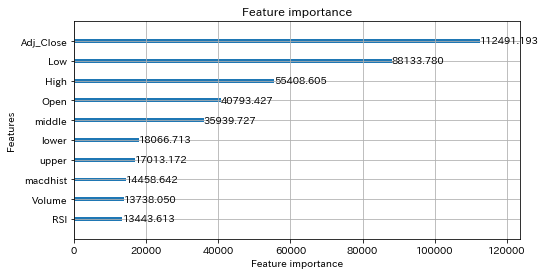

In [25]:
#特徴量重要度の可視化
lgb.plot_importance(model, figsize=(8,4), max_num_features=10, importance_type='gain')

## 4. LSTM

・まずは直近50日間のデータ（終値のみ）を用いて、翌日の株価を予測してみる  
→このモデルでもエポック数を上げるとラグモデルになることがわかった

参考：https://cpptake.com/archives/525

In [90]:
#データの取得
from pandas_datareader import data

start = "2011-09-01"
dt = datetime.today() 
end = dt.date()

df = data.DataReader("6840.T", "yahoo", start, end)
date= df.index

<AxesSubplot:xlabel='Date'>

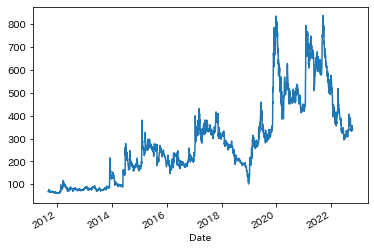

In [31]:
data = data['Adj Close']
data.plot()

In [130]:
#50日分のデータを1つとした窓を作る
def _load_data(data, n_prev = 50):  
   
    docX, docY = [], []
    for i in range(len(data)-n_prev):
        docX.append(data.iloc[i:i+n_prev])
        docY.append(data.iloc[i+n_prev])
    alsX = np.array(docX)
    alsY = np.array(docY)

    return alsX, alsY

def train_test_split(df, test_size=0.1, n_prev = 50):  
    
    ntrn = round(len(df) * (1 - test_size))
    ntrn = int(ntrn)
    X_train, y_train = _load_data(df.iloc[0:ntrn], n_prev)
    X_test, y_test = _load_data(df.iloc[ntrn:], n_prev)

    return (X_train, y_train), (X_test, y_test)

#株価の平均値で割ることで正規化を実施
df = data / data.mean()
length_of_sequences = 50
(X_train, y_train), (X_test, y_test) = train_test_split(df, test_size = 0.2, n_prev = length_of_sequences)

#確認
print("X_train = ",X_train.shape)
print("y_train = ",y_train.shape)
print("X_test  = ",X_test.shape)
print("y_test  = ",y_test.shape)

X_train =  (2413, 50)
y_train =  (2413,)
X_test  =  (224, 50)
y_test  =  (224,)


In [131]:
length_of_sequences = X_train.shape[1]
hidden_neurons = 128
in_out_neurons = 1

#LSTMモデル作成
model = Sequential()
model.add(LSTM(hidden_neurons, batch_input_shape=(None, length_of_sequences, in_out_neurons), return_sequences=False))
model.add(Dropout(0.25))
model.add(Dense(1, activation="linear")) 
model.compile(loss="mean_squared_error", optimizer="adam")

▼ エポック数10

In [132]:
model.fit(X_train, y_train, batch_size=128, epochs=10, validation_split=0.2)

Epoch 1/10
16/16 [==============================] - 4s 113ms/step - loss: 0.1187 - val_loss: 0.3229
Epoch 2/10
16/16 [==============================] - 1s 90ms/step - loss: 0.0140 - val_loss: 0.0972
Epoch 3/10
16/16 [==============================] - 2s 98ms/step - loss: 0.0093 - val_loss: 0.0605
Epoch 4/10
16/16 [==============================] - 1s 88ms/step - loss: 0.0087 - val_loss: 0.0574
Epoch 5/10
16/16 [==============================] - 2s 103ms/step - loss: 0.0080 - val_loss: 0.0469
Epoch 6/10
16/16 [==============================] - 2s 102ms/step - loss: 0.0073 - val_loss: 0.0345
Epoch 7/10
16/16 [==============================] - 1s 86ms/step - loss: 0.0072 - val_loss: 0.0344
Epoch 8/10
16/16 [==============================] - 1s 83ms/step - loss: 0.0068 - val_loss: 0.0426
Epoch 9/10
16/16 [==============================] - 1s 85ms/step - loss: 0.0068 - val_loss: 0.0327
Epoch 10/10
16/16 [==============================] - 1s 85ms/step - loss: 0.0064 - val_loss: 0.0306


7/7 [==============================] - 1s 12ms/step


<AxesSubplot:>

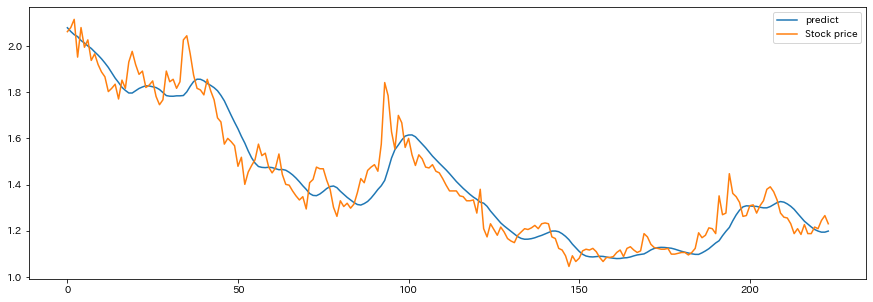

In [133]:
# 予測値算出
predicted = model.predict(X_test) 
# 実績と比較
dataf = pd.DataFrame(predicted)
dataf.columns = ["predict"]
dataf["Stock price"] = y_test
dataf.plot(figsize=(15, 5))

▼ エポック数60

In [134]:
model.fit(X_train, y_train, batch_size=128, epochs=60, validation_split=0.2)

Epoch 1/60
16/16 [==============================] - 1s 83ms/step - loss: 0.0063 - val_loss: 0.0271
Epoch 2/60
16/16 [==============================] - 1s 88ms/step - loss: 0.0066 - val_loss: 0.0261
Epoch 3/60
16/16 [==============================] - 1s 90ms/step - loss: 0.0066 - val_loss: 0.0565
Epoch 4/60
16/16 [==============================] - 2s 98ms/step - loss: 0.0078 - val_loss: 0.0584
Epoch 5/60
16/16 [==============================] - 2s 104ms/step - loss: 0.0066 - val_loss: 0.0315
Epoch 6/60
16/16 [==============================] - 1s 89ms/step - loss: 0.0061 - val_loss: 0.0328
Epoch 7/60
16/16 [==============================] - 1s 83ms/step - loss: 0.0060 - val_loss: 0.0233
Epoch 8/60
16/16 [==============================] - 1s 83ms/step - loss: 0.0061 - val_loss: 0.0219
Epoch 9/60
16/16 [==============================] - 1s 87ms/step - loss: 0.0057 - val_loss: 0.0230
Epoch 10/60
16/16 [==============================] - 1s 83ms/step - loss: 0.0054 - val_loss: 0.0273
Epoch 11

7/7 [==============================] - 0s 14ms/step


<AxesSubplot:>

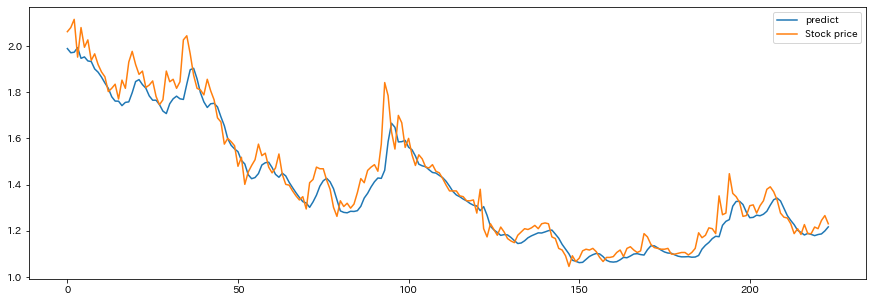

In [135]:
# 予測値算出
predicted = model.predict(X_test) 
# 実績と比較
dataf = pd.DataFrame(predicted)
dataf.columns = ["predict"]
dataf["Stock price"] = y_test
dataf.plot(figsize=(15, 5))

## 5. Prophet

・2017年にFacebookのCore Data Science teamによって開発された時系列解析用のライブラリ  
・基本的には、日付のdsカラムと、目的変数のyカラムによって分析を行う（単変量解析）

y=g(t)+s(t)+h(t)+ϵ_t  
y(t)：予測する変数  
g(t) ：トレンドの項  
s(t) ：周期性の項  
h(t) ：祝日効果(イベント効果)の項  
ϵ_t ：正規分布に従う誤差項(ノイズ)

参考：https://qiita.com/Blaster36/items/ac6fdc8b14f1049dd390

In [91]:
#データの取得
from pandas_datareader import data

start = "2011-09-01"
dt = datetime.today() 
end = dt.date()

df = data.DataReader("6840.T", "yahoo", start, end)
date= df.index

In [33]:
df['ds'] = date
df['y'] = df['Adj Close']
df = df[['ds','y']]
df

,ds,y
Date,,
2011-09-01,2011-09-01,69.0
2011-09-02,2011-09-02,69.0
2011-09-05,2011-09-05,68.0
2011-09-06,2011-09-06,69.0
2011-09-07,2011-09-07,70.0
...,...,...
2022-10-05,2022-10-05,340.0
2022-10-06,2022-10-06,350.0
2022-10-07,2022-10-07,356.0


In [34]:
model = Prophet()
model.fit(df)

16:23:09 - cmdstanpy - INFO - Chain [1] start processing
16:23:10 - cmdstanpy - INFO - Chain [1] done processing


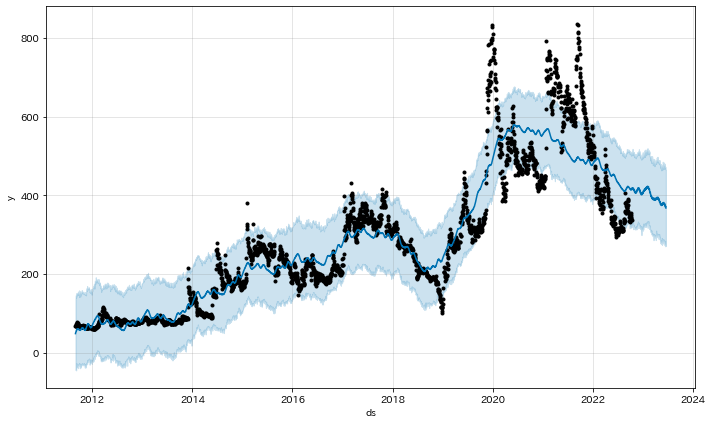

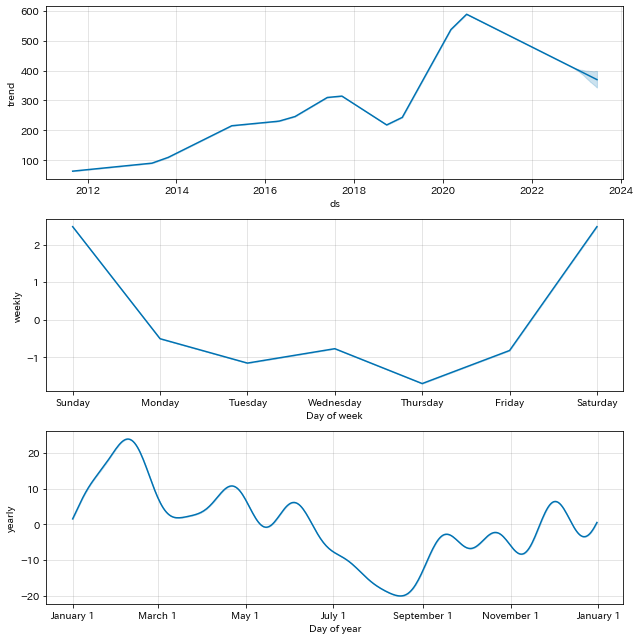

In [35]:
# Prophet 予測モデルの精度検証用データの生成
df_future = model.make_future_dataframe(periods=250, freq='d')
df_pred = model.predict(df_future)

# Prophet 予測モデルの予測結果（学習データ期間＋テストデータ期間）
df_pred_plot = model.plot(df_pred)         #予測値（黒い点は学習データの実測値）
df_pmpc = model.plot_components(df_pred)   #モデルの要素分解（トレンド、週周期、年周期）

## 6. 多変量LSTM

・まずは直近4日間のデータを用いて、翌日の株価を予測してみる  
→引き続きラグモデルになっていることがわかる

参考：https://relaxing-living-life.com/147/  
参考：https://qiita.com/ell/items/34f069651b551709d127     

In [92]:
#データの取得
from pandas_datareader import data

start = "2011-09-01"
dt = datetime.today() 
end = dt.date()

df = data.DataReader("6840.T", "yahoo", start, end)
date= df.index

In [93]:
#単純移動平均
df["5日間移動平均"]=df["Adj Close"].rolling(5).mean().round(1)
df["25日間移動平均"]=df["Adj Close"].rolling(25).mean().round(1)
df["50日間移動平均"]=df["Adj Close"].rolling(50).mean().round(1)

#MACD
df['macd'], df['macdsignal'], df['macdhist'] = ta.MACD(df['Adj Close'], fastperiod=12, slowperiod=26, signalperiod=9)

#RSI（25日）
df['RSI'] = ta.RSI(df['Adj Close'], timeperiod=25)

#ボリンジャーバンド
df['upper'], df['middle'], df['lower'] = ta.BBANDS(df['Adj Close'], timeperiod=25, nbdevup=2, nbdevdn=2, matype=0)

#終値の前日比の追加
df_shift = df.shift(1)
df['Close_ratio'] = (df['Close'] - df_shift['Close']) / df_shift['Close']

#欠損なしの行のみに変更
df = df[50:]

#不要列の削除
df = df.drop(['Close'], axis=1)

#列の順番の変更
df = df.reindex(columns=['High','Low','Open','Volume','5日間移動平均','25日間移動平均','50日間移動平均','macd','macdsignal','macdhist','RSI','upper','middle','lower','Close_ratio','Adj Close'])
df

,High,Low,Open,Volume,5日間移動平均,25日間移動平均,50日間移動平均,macd,macdsignal,macdhist,RSI,upper,middle,lower,Close_ratio,Adj Close
Date,,,,,,,,,,,,,,,,
2011-11-16,65.0,64.0,64.0,14000.0,65.4,67.2,68.7,-0.945222,-0.794825,-0.150397,44.969714,70.026636,67.16,64.293364,-0.015152,65.0
2011-11-17,63.0,62.0,62.0,8000.0,64.8,67.0,68.6,-1.145011,-0.864863,-0.280149,41.873139,70.233164,66.96,63.686836,-0.030769,63.0
2011-11-18,63.0,63.0,63.0,3000.0,64.4,66.8,68.5,-1.288492,-0.949589,-0.338904,41.873139,70.350209,66.76,63.169791,0.000000,63.0
2011-11-21,64.0,63.0,63.0,3000.0,64.0,66.6,68.4,-1.386223,-1.036915,-0.349307,41.873139,70.478144,66.60,62.721856,0.000000,63.0
2011-11-22,63.0,63.0,63.0,0.0,63.4,66.4,68.3,-1.446995,-1.118931,-0.328064,41.873139,70.561359,66.44,62.318641,0.000000,63.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-05,349.0,336.0,346.0,37100.0,339.0,358.1,344.7,-4.621168,-1.336537,-3.284631,48.099586,393.552505,358.12,322.687495,-0.005848,340.0
2022-10-06,351.0,337.0,337.0,34000.0,340.0,357.0,345.3,-3.864917,-1.842213,-2.022704,50.626048,391.469036,356.96,322.450964,0.029412,350.0
2022-10-07,357.0,347.0,350.0,51500.0,344.4,356.3,346.1,-2.749736,-2.023717,-0.726018,52.083867,390.278657,356.32,322.361343,0.017143,356.0


In [94]:
#標準化
scaler = StandardScaler()
scaled_df = scaler.fit_transform(df)

In [95]:
#訓練データの切り分け
2687*0.8

2149.6

In [96]:
train_size = 2149
train = scaled_df[0:train_size, :]

In [97]:
#LSTM用データへの変換
X_train = []
y_train = []
reference_size = 4

for i in range(reference_size, len(train)):
    xset = []
    for j in range(train.shape[1]):
        a = train[i-reference_size:i, j]
        xset.append(a)
    X_train.append(xset)
#    y_train.append(train[i, 15])

In [98]:
y_train = df['Adj Close'][reference_size:train_size]

In [99]:
#np.arrayに変換
X_train, y_train = np.array(X_train), np.array(y_train)

#訓練データのNumpy配列について、奥行を訓練データの数、行を50日分のデータ、列を抽出した株価データの種類数、の3次元に変換する
X_train_3D = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], X_train.shape[2]))

In [100]:
X_train_3D.shape

(2145, 16, 4)

In [101]:
#LSTMモデル作成
neuron = 128
dropout = 0.25
epochs = 10

model = Sequential()
model.add(LSTM(neuron, activation="relu", batch_input_shape=(None, X_train_3D.shape[1], reference_size), return_sequences=False))
model.add(Dropout(dropout))
model.add(Dense(1, activation="linear")) 
model.compile(loss="mean_squared_error", optimizer="adam")
model.fit(X_train_3D, y_train, batch_size=128, epochs=epochs)

Epoch 1/10
17/17 [==============================] - 3s 42ms/step - loss: 71073.7344
Epoch 2/10
17/17 [==============================] - 1s 41ms/step - loss: 62651.2266
Epoch 3/10
17/17 [==============================] - 1s 41ms/step - loss: 58165.5195
Epoch 4/10
17/17 [==============================] - 1s 40ms/step - loss: 53255.4648
Epoch 5/10
17/17 [==============================] - 1s 42ms/step - loss: 48226.3594
Epoch 6/10
17/17 [==============================] - 1s 42ms/step - loss: 23644.5059
Epoch 7/10
17/17 [==============================] - 1s 41ms/step - loss: 4209.2319
Epoch 8/10
17/17 [==============================] - 1s 41ms/step - loss: 2027.7338
Epoch 9/10
17/17 [==============================] - 1s 42ms/step - loss: 1403.6217
Epoch 10/10
17/17 [==============================] - 1s 43ms/step - loss: 1264.8629


In [102]:
#テスト用データの加工
test = scaled_df[train_size - reference_size:, :]

X_test = []

for i in range(reference_size, len(test)):
    xset = []
    for j in range(test.shape[1]):
        a = test[i-reference_size:i, j]
        xset.append(a)
    X_test.append(xset)

In [103]:
#np.arrayに変換
X_test = np.array(X_test)

#訓練データのNumpy配列について、奥行を訓練データの数、行を50日分のデータ、列を抽出した株価データの種類数、の3次元に変換する
X_test_3D = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], X_test.shape[2]))

In [104]:
# モデルに検証データを代入して予測を行う
predictions = model.predict(X_test_3D)

17/17 [==============================] - 1s 9ms/step


In [105]:
predictions[:5]

array([[427.63055],
       [426.7233 ],
       [427.17743],
       [426.65527],
       [425.93497]], dtype=float32)

In [106]:
#データをプロット
valid = df[train.shape[0]:].copy()

#予測価格を保持する新しい列を作成
valid['Predictions'] = predictions
valid.head()

,High,Low,Open,Volume,5日間移動平均,25日間移動平均,50日間移動平均,macd,macdsignal,macdhist,RSI,upper,middle,lower,Close_ratio,Adj Close,Predictions
Date,,,,,,,,,,,,,,,,,
2020-07-29,467.0,452.0,456.0,100000.0,463.4,472.3,507.0,-9.759413,-10.963025,1.203612,44.806024,497.234060,472.32,447.405940,-0.001080,462.5,427.630554
2020-07-30,468.5,456.0,467.5,60000.0,461.6,470.8,505.3,-9.879846,-10.746389,0.866543,43.705847,495.050279,470.84,446.629721,-0.014054,456.0,426.723297
2020-07-31,464.5,447.5,456.0,166000.0,459.2,469.5,503.1,-10.061041,-10.609319,0.548278,43.280082,493.844600,469.54,445.235400,-0.005482,453.5,427.177429
2020-08-03,468.0,453.5,453.5,94000.0,459.9,469.2,500.9,-9.210855,-10.329626,1.118772,45.704329,493.470854,469.16,444.849146,0.024256,464.5,426.655273
2020-08-04,473.0,462.5,473.0,50000.0,460.2,467.4,498.5,-8.439787,-9.951659,1.511871,45.704329,485.486971,467.38,449.273029,0.000000,464.5,425.934967


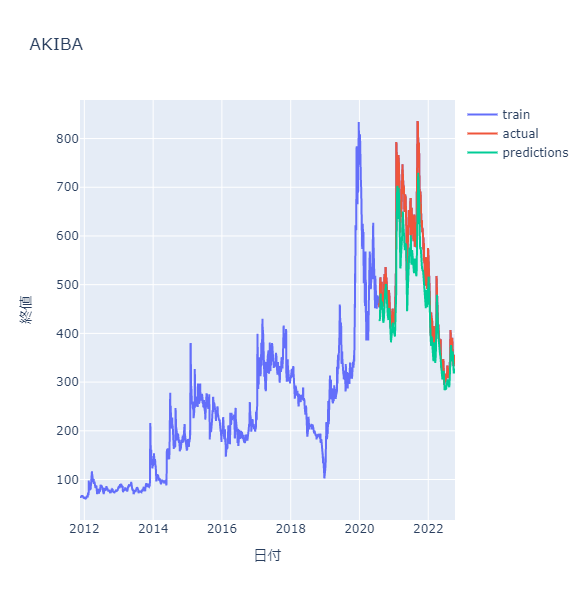

In [107]:
#可視化
pre_date = valid.index

fig = go.Figure()

fig.add_trace(go.Scatter(x=date[50:], y=df['Adj Close'], name='train'))
fig.add_trace(go.Scatter(x=pre_date, y=valid['Adj Close'], name='actual'))
fig.add_trace(go.Scatter(x=pre_date, y=valid['Predictions'], name='predictions'))

fig.update_layout(title='AKIBA', width=1000, height=600)
fig.update_xaxes(title='日付')
fig.update_yaxes(title='終値')

fig.show()

## 6-1. 多変量LSTM（検証）

①改めて予測する未来を遠くしてみたらどうなるか？  

＜得られた結果＞  
・ランダムフォレスト時のような乱高下はないが、翌日予測の場合に数日遅れだったものが、遠くした未来分余計にラグが大きくなっているような動きになった

②パラメータ（エポック数、ドロップアウト）、特徴量を変更してみたらどうなるか？？

＜得られた結果＞  
・直接的な株価を特徴量から除くとうまく予測できなくなった

In [135]:
#データの取得
from pandas_datareader import data

start = "2011-09-01"
dt = datetime.today() 
end = dt.date()

df = data.DataReader("6840.T", "yahoo", start, end)
date2 = df.index

#単純移動平均
df["5日間移動平均"]=df["Adj Close"].rolling(5).mean().round(1)
df["25日間移動平均"]=df["Adj Close"].rolling(25).mean().round(1)
df["50日間移動平均"]=df["Adj Close"].rolling(50).mean().round(1)

#MACD
df['macd'], df['macdsignal'], df['macdhist'] = ta.MACD(df['Adj Close'], fastperiod=12, slowperiod=26, signalperiod=9)

#RSI（25日）
df['RSI'] = ta.RSI(df['Adj Close'], timeperiod=25)

#ボリンジャーバンド
df['upper'], df['middle'], df['lower'] = ta.BBANDS(df['Adj Close'], timeperiod=25, nbdevup=2, nbdevdn=2, matype=0)

#終値の前日比の追加
df_shift = df.shift(1)
df['Close_ratio'] = (df['Close'] - df_shift['Close']) / df_shift['Close']

#欠損なしの行のみに変更
df = df[50:]

#不要列の削除
df = df.drop(['Close'], axis=1)

#列の順番の変更
df = df.reindex(columns=['High','Low','Open','Volume','5日間移動平均','25日間移動平均','50日間移動平均','macd','macdsignal','macdhist','RSI','upper','middle','lower','Close_ratio','Adj Close'])

#標準化
scaler = StandardScaler()
scaled_df = scaler.fit_transform(df)

train_size = 2149
train = scaled_df[0:train_size, :]

▼ もう少し未来を予測させてみたらどうか？

In [126]:
#LSTM用データへの変換
X_train = []
y_train = []

# _____________________________________________

reference_size = 20
x_days = 20  # x+1日後を予測する

# _____________________________________________

for i in range(reference_size, len(train)):
    xset = []
    for j in range(train.shape[1]):
        a = train[i-reference_size:i, j]
        xset.append(a)
    X_train.append(xset)
    
y_train = df['Adj Close'][reference_size+x_days:train_size+x_days]

#np.arrayに変換
X_train, y_train = np.array(X_train), np.array(y_train)

#訓練データのNumpy配列について、奥行を訓練データの数、行をreference日分のデータ、列を抽出した株価データの種類数、の3次元に変換する
X_train_3D = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], X_train.shape[2]))

#LSTMモデル作成
neuron = 128
dropout = 0.25
epochs = 10

model = Sequential()
model.add(LSTM(neuron, activation="relu", batch_input_shape=(None, X_train_3D.shape[1], reference_size), return_sequences=False))
model.add(Dropout(dropout))
model.add(Dense(1, activation="linear")) 
model.compile(loss="mean_squared_error", optimizer="adam")
model.fit(X_train_3D, y_train, batch_size=128, epochs=epochs)

Epoch 1/10
17/17 [==============================] - 4s 38ms/step - loss: 69871.2734
Epoch 2/10
17/17 [==============================] - 1s 41ms/step - loss: 57869.5664
Epoch 3/10
17/17 [==============================] - 1s 41ms/step - loss: 42535.7695
Epoch 4/10
17/17 [==============================] - 1s 41ms/step - loss: 17392.9609
Epoch 5/10
17/17 [==============================] - 1s 41ms/step - loss: 6645.4956
Epoch 6/10
17/17 [==============================] - 1s 41ms/step - loss: 5470.5898
Epoch 7/10
17/17 [==============================] - 1s 41ms/step - loss: 4910.2734
Epoch 8/10
17/17 [==============================] - 1s 41ms/step - loss: 4363.1050
Epoch 9/10
17/17 [==============================] - 1s 41ms/step - loss: 3949.0264
Epoch 10/10
17/17 [==============================] - 1s 41ms/step - loss: 3993.4036


In [114]:
#テスト用データの加工
test = scaled_df[train_size - reference_size: -x_days, :]

X_test = []

for i in range(reference_size, len(test)):
    xset = []
    for j in range(test.shape[1]):
        a = test[i-reference_size:i, j]
        xset.append(a)
    X_test.append(xset)

#np.arrayに変換
X_test = np.array(X_test)

#訓練データのNumpy配列について、奥行を訓練データの数、行をreference日分のデータ、列を抽出した株価データの種類数、の3次元に変換する
X_test_3D = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], X_test.shape[2]))

# モデルに検証データを代入して予測を行う
predictions = model.predict(X_test_3D)

17/17 [==============================] - 0s 9ms/step


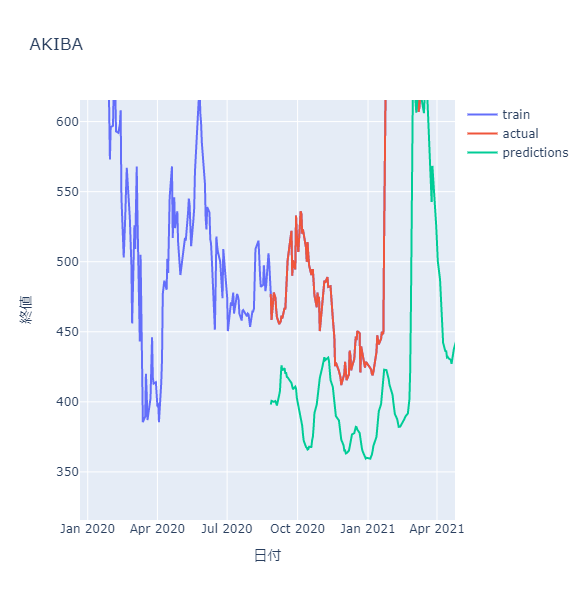

In [115]:
#データをプロット
valid = df[train.shape[0]+ x_days:].copy()

#予測価格を保持する新しい列を作成
valid['Predictions'] = predictions

#可視化
pre_date = valid.index

fig = go.Figure()

fig.add_trace(go.Scatter(x=date[50:], y=df['Adj Close'], name='train'))
fig.add_trace(go.Scatter(x=pre_date, y=valid['Adj Close'], name='actual'))
fig.add_trace(go.Scatter(x=pre_date, y=valid['Predictions'], name='predictions'))

fig.update_layout(title='AKIBA', width=1000, height=600)
fig.update_xaxes(title='日付')
fig.update_yaxes(title='終値')

fig.show()

→未来を予測しているため、トレンドが遅れて現れるような動きになっているように感じる  
全体的に低い株価を示している理由・原因は不明

▼  パラメータ（エポック数、ドロップアウト）、特徴量を変更したらどうか？

・パラメータ

In [136]:
#LSTM用データへの変換
X_train = []
y_train = []

# ____________________________

reference_size = 4
x_days = 1  # x+1日後を予測する

# ____________________________


for i in range(reference_size, len(train)):
    xset = []
    for j in range(train.shape[1]):
        a = train[i-reference_size:i, j]
        xset.append(a)
    X_train.append(xset)
    
y_train = df['Adj Close'][reference_size + x_days:train_size + x_days]

#np.arrayに変換
X_train, y_train = np.array(X_train), np.array(y_train)

#訓練データのNumpy配列について、奥行を訓練データの数、行をreference日分のデータ、列を抽出した株価データの種類数、の3次元に変換する
X_train_3D = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], X_train.shape[2]))

#LSTMモデル作成① 全結合層を増やしてみる
neuron = 128
dropout = 0.25
epochs = 10

model = Sequential()
model.add(LSTM(neuron, activation="relu", batch_input_shape=(None, X_train_3D.shape[1], reference_size), return_sequences=False))
model.add(Dropout(dropout))
model.add(Dense(1, activation="linear")) 
model.add(Dropout(dropout))
model.add(Dense(1, activation="linear")) 
model.compile(loss="mean_squared_error", optimizer="adam")
model.fit(X_train_3D, y_train, batch_size=128, epochs=epochs)

Epoch 1/10
17/17 [==============================] - 3s 39ms/step - loss: 71112.2031
Epoch 2/10
17/17 [==============================] - 1s 40ms/step - loss: 64028.8906
Epoch 3/10
17/17 [==============================] - 1s 39ms/step - loss: 55518.5625
Epoch 4/10
17/17 [==============================] - 1s 39ms/step - loss: 32413.8398
Epoch 5/10
17/17 [==============================] - 1s 40ms/step - loss: 20963.5664
Epoch 6/10
17/17 [==============================] - 1s 40ms/step - loss: 20229.1797
Epoch 7/10
17/17 [==============================] - 1s 39ms/step - loss: 17313.7832
Epoch 8/10
17/17 [==============================] - 1s 39ms/step - loss: 21411.9492
Epoch 9/10
17/17 [==============================] - 1s 40ms/step - loss: 19468.6211
Epoch 10/10
17/17 [==============================] - 1s 39ms/step - loss: 20012.8477


In [137]:
#LSTMモデル作成② dropoutの比率を上げてみる
neuron = 128
dropout = 0.5
epochs = 10

model = Sequential()
model.add(LSTM(neuron, activation="relu", batch_input_shape=(None, X_train_3D.shape[1], reference_size), return_sequences=False))
model.add(Dropout(dropout))
model.add(Dense(1, activation="linear")) 
model.compile(loss="mean_squared_error", optimizer="adam")
model.fit(X_train_3D, y_train, batch_size=128, epochs=epochs)

Epoch 1/10
17/17 [==============================] - 4s 41ms/step - loss: 69607.0391
Epoch 2/10
17/17 [==============================] - 1s 40ms/step - loss: 69298.6094
Epoch 3/10
17/17 [==============================] - 1s 40ms/step - loss: 66853.4766
Epoch 4/10
17/17 [==============================] - 1s 40ms/step - loss: 61699.7773
Epoch 5/10
17/17 [==============================] - 1s 40ms/step - loss: 52458.9219
Epoch 6/10
17/17 [==============================] - 1s 39ms/step - loss: 23180.8203
Epoch 7/10
17/17 [==============================] - 1s 40ms/step - loss: 5811.7729
Epoch 8/10
17/17 [==============================] - 1s 41ms/step - loss: 4363.1040
Epoch 9/10
17/17 [==============================] - 1s 42ms/step - loss: 3235.6348
Epoch 10/10
17/17 [==============================] - 1s 41ms/step - loss: 2755.0610


In [130]:
#LSTMモデル作成③ epochsを上げてみる
neuron = 128
dropout = 0.25
epochs = 20

model = Sequential()
model.add(LSTM(neuron, activation="relu", batch_input_shape=(None, X_train_3D.shape[1], reference_size), return_sequences=False))
model.add(Dropout(dropout))
model.add(Dense(1, activation="linear")) 
model.compile(loss="mean_squared_error", optimizer="adam")
model.fit(X_train_3D, y_train, batch_size=128, epochs=epochs)

Epoch 1/20
17/17 [==============================] - 4s 42ms/step - loss: 77299.3906
Epoch 2/20
17/17 [==============================] - 1s 43ms/step - loss: 61119.1523
Epoch 3/20
17/17 [==============================] - 1s 43ms/step - loss: 53652.1133
Epoch 4/20
17/17 [==============================] - 1s 43ms/step - loss: 46732.5078
Epoch 5/20
17/17 [==============================] - 1s 44ms/step - loss: 28101.9102
Epoch 6/20
17/17 [==============================] - 1s 44ms/step - loss: 7841.3643
Epoch 7/20
17/17 [==============================] - 1s 43ms/step - loss: 4613.4585
Epoch 8/20
17/17 [==============================] - 1s 44ms/step - loss: 4146.0898
Epoch 9/20
17/17 [==============================] - 1s 44ms/step - loss: 4138.0981
Epoch 10/20
17/17 [==============================] - 1s 47ms/step - loss: 4024.8674
Epoch 11/20
17/17 [==============================] - 1s 43ms/step - loss: 3834.6497
Epoch 12/20
17/17 [==============================] - 1s 43ms/step - loss: 3573.5

In [138]:
#テスト用データの加工
test = scaled_df[train_size - reference_size: -x_days, :]

X_test = []

for i in range(reference_size, len(test)):
    xset = []
    for j in range(test.shape[1]):
        a = test[i-reference_size:i, j]
        xset.append(a)
    X_test.append(xset)

#np.arrayに変換
X_test = np.array(X_test)

#訓練データのNumpy配列について、奥行を訓練データの数、行をreference日分のデータ、列を抽出した株価データの種類数、の3次元に変換する
X_test_3D = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], X_test.shape[2]))

# モデルに検証データを代入して予測を行う
predictions = model.predict(X_test_3D)

17/17 [==============================] - 0s 9ms/step


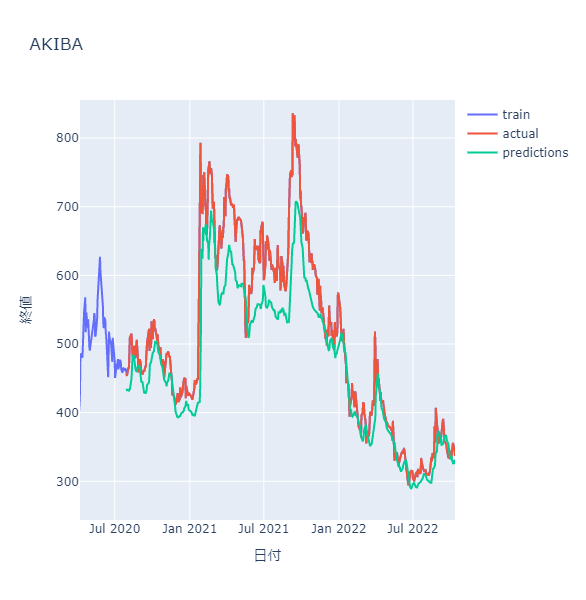

In [139]:
#データをプロット
valid = df[train.shape[0]+ x_days:].copy()

#予測価格を保持する新しい列を作成
valid['Predictions'] = predictions

#可視化
pre_date = valid.index

fig = go.Figure()

fig.add_trace(go.Scatter(x=date[50:], y=df['Adj Close'], name='train'))
fig.add_trace(go.Scatter(x=pre_date, y=valid['Adj Close'], name='actual'))
fig.add_trace(go.Scatter(x=pre_date, y=valid['Predictions'], name='predictions'))

fig.update_layout(title='AKIBA', width=1000, height=600)
fig.update_xaxes(title='日付')
fig.update_yaxes(title='終値')

fig.show()

ドロップアウトを大きくしても変化がないが、全結合層を１層増やすと精度が下がった  
また、その状態でドロップアウトを大きくするとさらに精度が下がった

・特徴量  
今回は直接の株価になる項目を削除して予測させてみることにする

In [120]:
#特徴量の変更
columns = ['5日間移動平均','50日間移動平均','macd','RSI','upper','lower','Close_ratio']
df = df.reindex(columns=columns)

#標準化
scaler = StandardScaler()
scaled_df = scaler.fit_transform(df)

train_size = 2149
train = scaled_df[0:train_size, :]

In [121]:
#LSTM用データへの変換
X_train = []
y_train = []

# ___________________________________

reference_size = 4

# ___________________________________

for i in range(reference_size, len(train)):
    xset = []
    for j in range(train.shape[1]):
        a = train[i-reference_size:i, j]
        xset.append(a)
    X_train.append(xset)
    
from pandas_datareader import data

start = "2011-09-01"
dt = datetime.today() 
end = dt.date()

#別途データフレームを用意しておく（trainにAdj Closeを含ませない場合、グラフ表示の際に使用するため）
y_df = data.DataReader("6840.T", "yahoo", start, end)
y_train = y_df['Adj Close'][reference_size:train_size]

#np.arrayに変換
X_train, y_train = np.array(X_train), np.array(y_train)

#訓練データのNumpy配列について、奥行を訓練データの数、行をreference日分のデータ、列を抽出した株価データの種類数、の3次元に変換する
X_train_3D = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], X_train.shape[2]))

#LSTMモデル作成
neuron = 128
dropout = 0.25
epochs = 10

model = Sequential()
model.add(LSTM(neuron, activation="relu", batch_input_shape=(None, X_train_3D.shape[1], reference_size), return_sequences=False))
model.add(Dropout(dropout))
model.add(Dense(1, activation="linear")) 
model.compile(loss="mean_squared_error", optimizer="adam")
model.fit(X_train_3D, y_train, batch_size=128, epochs=10)

Epoch 1/10
17/17 [==============================] - 3s 18ms/step - loss: 65243.6797
Epoch 2/10
17/17 [==============================] - 0s 20ms/step - loss: 59998.9883
Epoch 3/10
17/17 [==============================] - 0s 20ms/step - loss: 45298.5312
Epoch 4/10
17/17 [==============================] - 0s 20ms/step - loss: 30912.8594
Epoch 5/10
17/17 [==============================] - 0s 20ms/step - loss: 10945.6582
Epoch 6/10
17/17 [==============================] - 0s 20ms/step - loss: 3162.4209
Epoch 7/10
17/17 [==============================] - 0s 20ms/step - loss: 2515.2737
Epoch 8/10
17/17 [==============================] - 0s 20ms/step - loss: 2310.8674
Epoch 9/10
17/17 [==============================] - 0s 20ms/step - loss: 2205.0833
Epoch 10/10
17/17 [==============================] - 0s 20ms/step - loss: 2050.4856


In [122]:
#テスト用データの加工
test = scaled_df[train_size - reference_size:, :]

X_test = []

for i in range(reference_size, len(test)):
    xset = []
    for j in range(test.shape[1]):
        a = test[i-reference_size:i, j]
        xset.append(a)
    X_test.append(xset)

#np.arrayに変換
X_test = np.array(X_test)

#訓練データのNumpy配列について、奥行を訓練データの数、行をreference日分のデータ、列を抽出した株価データの種類数、の3次元に変換する
X_test_3D = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], X_test.shape[2]))

# モデルに検証データを代入して予測を行う
predictions = model.predict(X_test_3D)

17/17 [==============================] - 0s 5ms/step


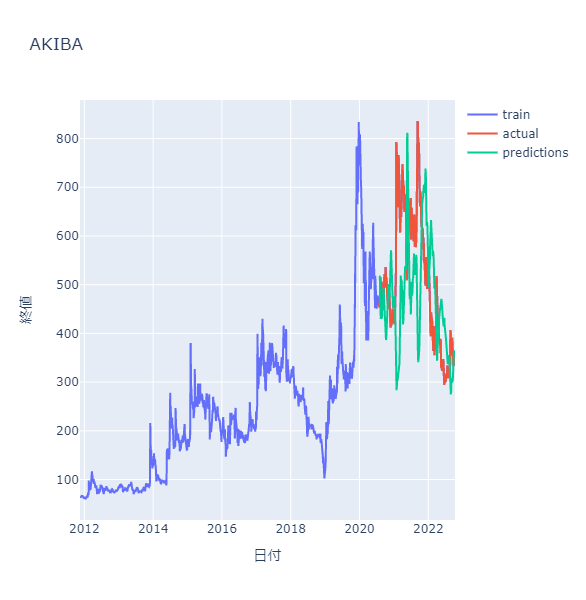

In [124]:
#データをプロット
valid = df[train.shape[0]:].copy()

#予測価格を保持する新しい列を作成
valid['Predictions'] = predictions

#可視化
pre_date = valid.index

fig = go.Figure()

fig.add_trace(go.Scatter(x=date[50:], y=y_df['Adj Close'][50:], name='train'))
fig.add_trace(go.Scatter(x=date[50+ X_train.shape[0]+ reference_size:], y=y_df['Adj Close'][50+ X_train.shape[0]+ reference_size:], name='actual'))
fig.add_trace(go.Scatter(x=pre_date, y=valid['Predictions'], name='predictions'))

fig.update_layout(title='AKIBA', width=1000, height=600)
fig.update_xaxes(title='日付')
fig.update_yaxes(title='終値')

fig.show()

直接の株価データ（Open~Closeなど）を含めない場合、かなり精度が下がる  
データを取り方によってはまた違う動きが出そうだが、これまでがやはりラグモデルであったことの証明になった形でもありそう

## 得た知見、考察

そもそも株価の上下に明確な法則があれば儲け放題のため、過去の株価からのデータでは分析不可能であるはず  
また、株の取引ではいくらになるかよりも、収益が上がるかが最終的な目標であることになる場合が多いようで、  
したがって、株価の値そのものを予測するのではなく、売買ポイントを予測したりや売買ルールを作成する研究が増えているとのこと  

## メモ

応用：https://www.codexa.net/keras-lstm-cryptos-forecast/  
LSTM（分類）：https://rightcode.co.jp/blog/information-technology/deep-learning-stock-price-forecast-create#i-8  
関連論文：https://nehori.com/nikki/2020/02/13/post-15594/  
